##Initial Analysis


#Univariate analysis

#Initial Setup

In [ ]:
#Load the data and perform basic checks
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
data = pd.read_csv('cleaned_data.csv')


##Convert Data Types

In [ ]:
#Convert the date column to datetime
data['date'] = pd.to_datetime(data['date'], errors='coerce')

##Check for Missing Values

In [ ]:
# Check for missing values
print("Missing values:\n", data.isnull().sum())

# Display summary statistics
print("Summary statistics:\n", data.describe(include='all'))


Missing values:
 user_id               0
date                  0
steps                 0
calories_burned       0
distance_km           0
active_minutes        0
sleep_hours           0
heart_rate_avg        0
workout_type          0
weather_conditions    0
location              0
mood                  0
dtype: int64
Summary statistics:
               user_id                           date          steps  \
count   856880.000000                         856880  856880.000000   
unique            NaN                            NaN            NaN   
top               NaN                            NaN            NaN   
freq              NaN                            NaN            NaN   
mean       499.554805  2024-05-14 10:59:54.891233024   15008.651773   
min          1.000000            2023-01-01 00:00:00       0.000000   
25%        250.000000            2023-09-07 00:00:00    7490.000000   
50%        499.000000            2024-05-14 00:00:00   15026.000000   
75%        749.000000 

##Univariate Analysis of Numerical Columns


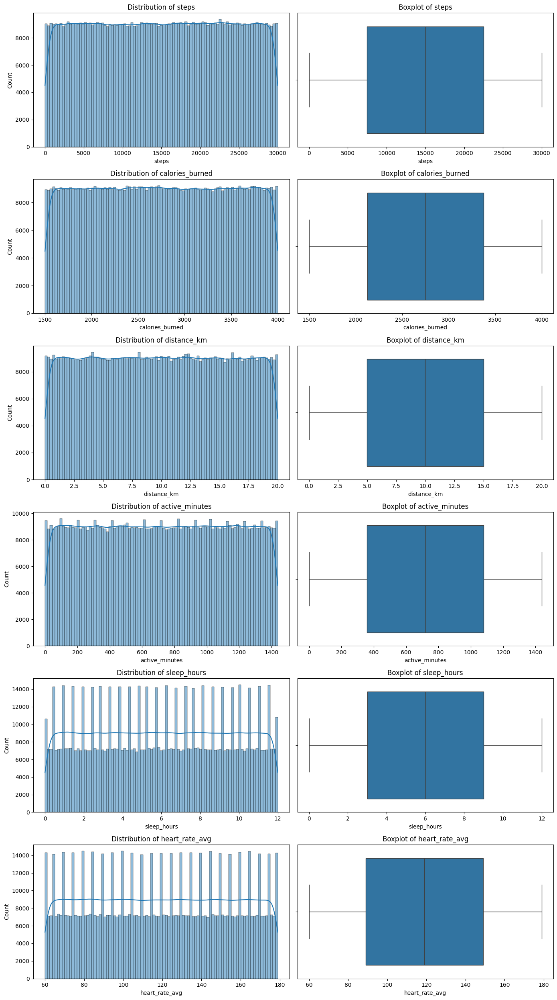

In [ ]:
#Plot histograms and boxplots to visualize distributions and detect outliers

# Define numerical columns
numerical_cols = ['steps', 'calories_burned', 'distance_km', 'active_minutes', 'sleep_hours', 'heart_rate_avg']

# Set up the plotting grid
fig, axes = plt.subplots(len(numerical_cols), 2, figsize=(14, 25))
for i, col in enumerate(numerical_cols):
    # Distribution plot
    sns.histplot(data[col], kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f'Distribution of {col}')

    # Boxplot for outliers
    sns.boxplot(x=data[col], ax=axes[i, 1])
    axes[i, 1].set_title(f'Boxplot of {col}')

plt.tight_layout()
plt.show()


##Univariate Analysis of Categorical Columns

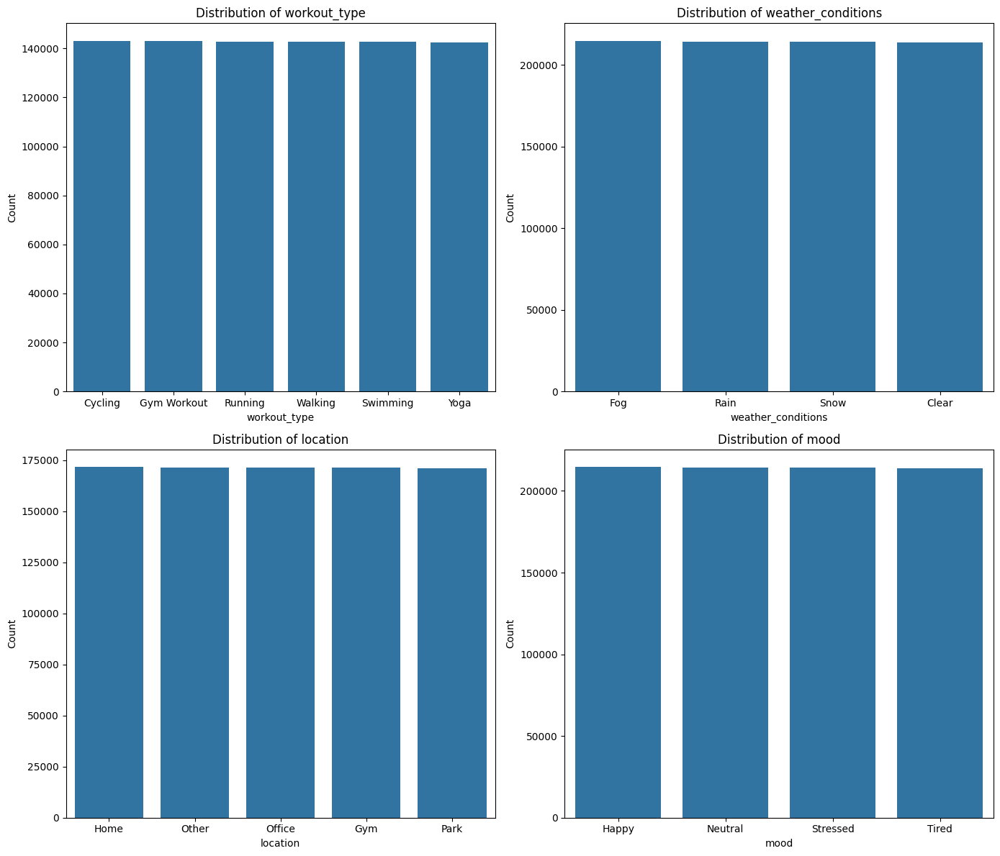

In [ ]:
#Analyze distributions of categorical variables and visualize the counts

# Define categorical columns
categorical_cols = ['workout_type', 'weather_conditions', 'location', 'mood']

# Plot bar charts for categorical columns
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for i, col in enumerate(categorical_cols):
    sns.countplot(x=data[col], order=data[col].value_counts().index, ax=axes[i // 2, i % 2])
    axes[i // 2, i % 2].set_title(f'Distribution of {col}')
    axes[i // 2, i % 2].set_xlabel(col)
    axes[i // 2, i % 2].set_ylabel('Count')

plt.tight_layout()
plt.show()


##Identifying Low Variance Columns

In [ ]:
#Remove or flag columns with low variance

# Calculate variance for numerical columns
low_variance_cols = [col for col in numerical_cols if data[col].var() < 0.1]
print("Low variance columns:", low_variance_cols)


Low variance columns: []


##Check Imbalance in Target Variable

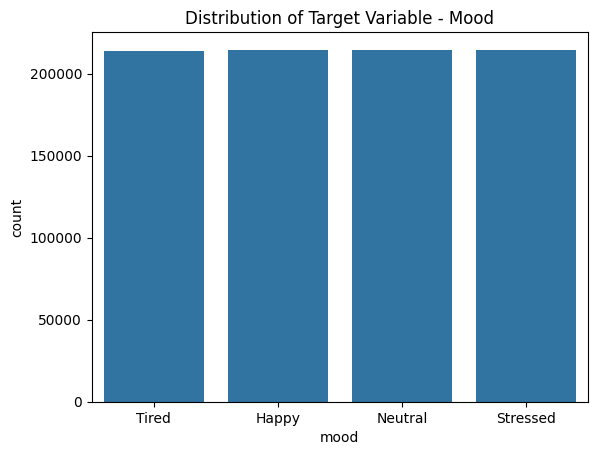

In [ ]:
#Visualize the balance of classes in the mood column if it’s the target

# Plot mood distribution
sns.countplot(x=data['mood'])
plt.title("Distribution of Target Variable - Mood")
plt.show()


##Date-Based Analysis

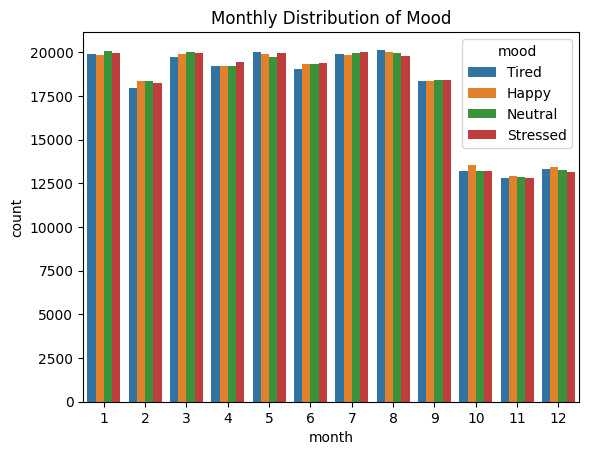

In [ ]:
# Extract year, month, and day if relevant for analysis
data['year'] = data['date'].dt.year
data['month'] = data['date'].dt.month
data['day'] = data['date'].dt.day

# Plot time-based trends, e.g., monthly mood distribution
sns.countplot(x=data['month'], hue=data['mood'])
plt.title("Monthly Distribution of Mood")
plt.show()


##Bivariate analysis

#Pairwise Relationships using Scatter Plots

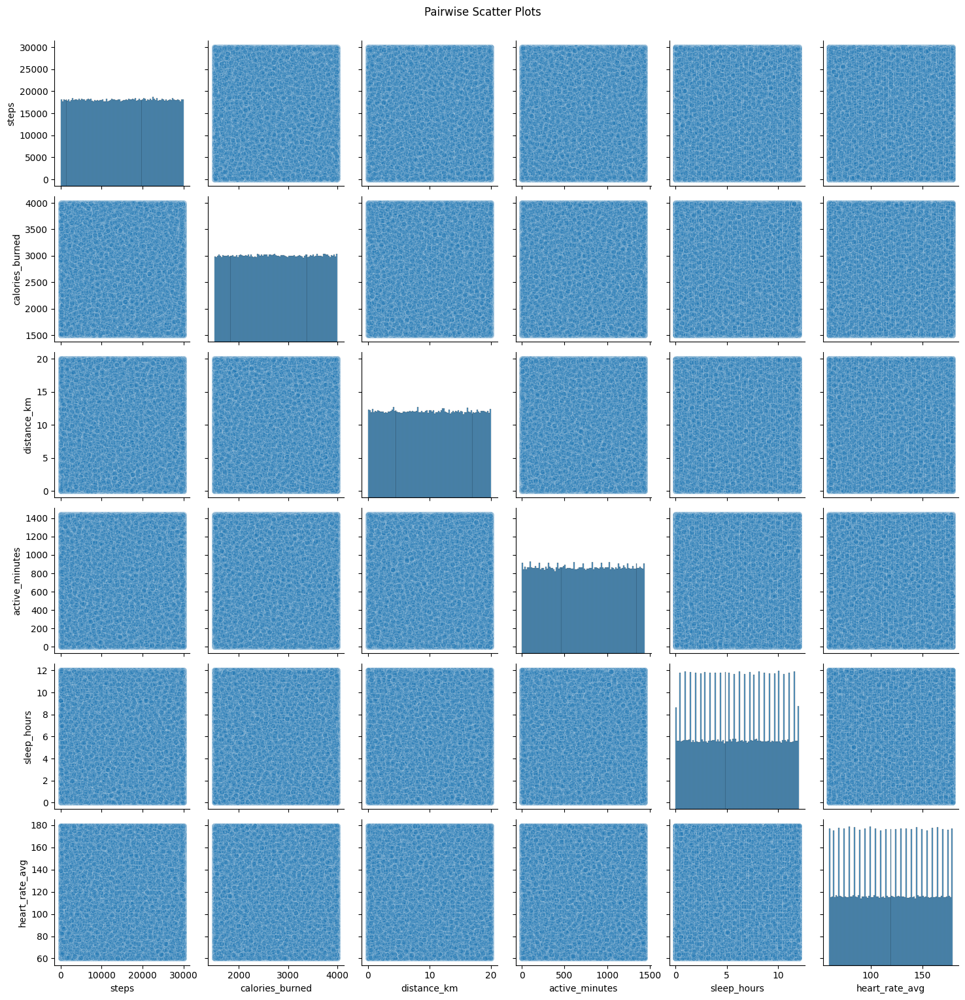

In [ ]:
# Importing required libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Define numerical columns for pairwise analysis
numerical_cols = ['steps', 'calories_burned', 'distance_km', 'active_minutes', 'sleep_hours', 'heart_rate_avg']

# Create scatter plots for each pair of numerical columns
sns.pairplot(data[numerical_cols], kind='scatter', plot_kws={'alpha':0.2})
plt.suptitle("Pairwise Scatter Plots", y=1.02)
plt.show()


##Correlation Analysis

Pearson Correlation:
                     steps  calories_burned  distance_km  active_minutes  \
steps            1.000000         0.000426     0.001494       -0.000684   
calories_burned  0.000426         1.000000    -0.000119        0.000255   
distance_km      0.001494        -0.000119     1.000000        0.002579   
active_minutes  -0.000684         0.000255     0.002579        1.000000   
sleep_hours     -0.000433        -0.001669     0.000579       -0.000501   
heart_rate_avg  -0.001278        -0.000004    -0.000620        0.001532   

                 sleep_hours  heart_rate_avg  
steps              -0.000433       -0.001278  
calories_burned    -0.001669       -0.000004  
distance_km         0.000579       -0.000620  
active_minutes     -0.000501        0.001532  
sleep_hours         1.000000       -0.000612  
heart_rate_avg     -0.000612        1.000000  
Spearman Correlation:
                     steps  calories_burned  distance_km  active_minutes  \
steps            1.000000

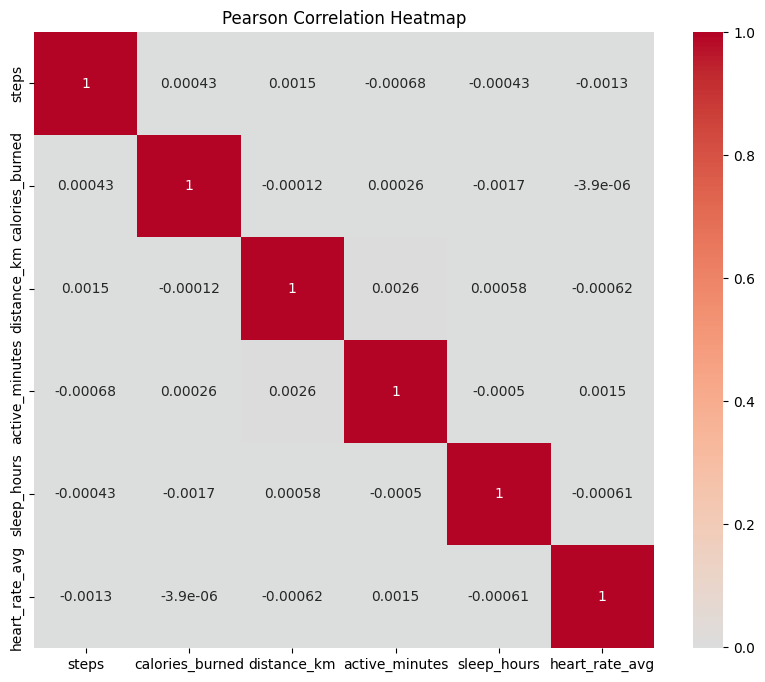

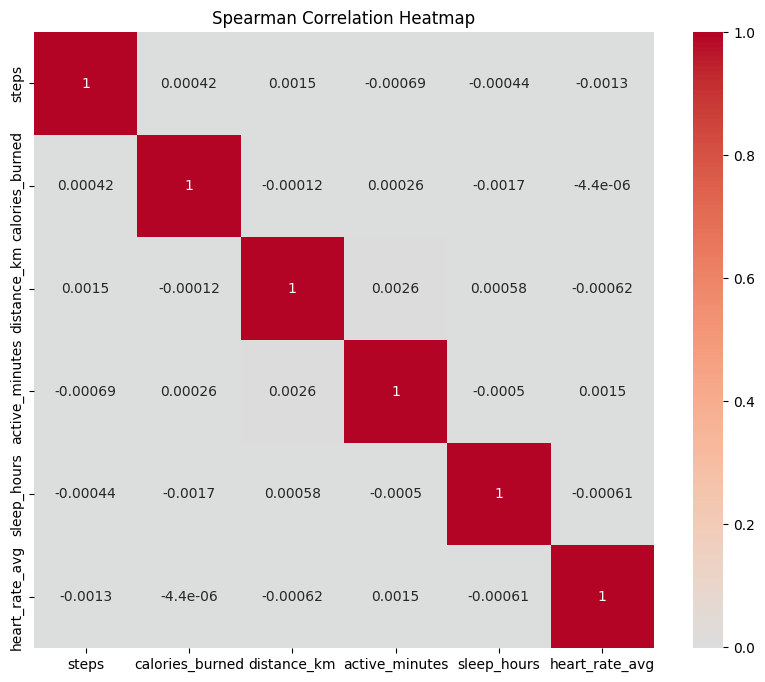

In [ ]:
# Calculate Pearson correlation
pearson_corr = data[numerical_cols].corr(method='pearson')
print("Pearson Correlation:\n", pearson_corr)

# Calculate Spearman correlation
spearman_corr = data[numerical_cols].corr(method='spearman')
print("Spearman Correlation:\n", spearman_corr)

# Visualize Pearson correlation with a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(pearson_corr, annot=True, cmap='coolwarm', center=0)
plt.title("Pearson Correlation Heatmap")
plt.show()

# Visualize Spearman correlation with a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(spearman_corr, annot=True, cmap='coolwarm', center=0)
plt.title("Spearman Correlation Heatmap")
plt.show()


##Handling Strong Correlations

In [ ]:
# Set correlation threshold
correlation_threshold = 0.8

# Find highly correlated pairs
high_corr_pairs = [(col1, col2, pearson_corr.loc[col1, col2]) for col1 in pearson_corr.columns for col2 in pearson_corr.columns
                   if col1 != col2 and abs(pearson_corr.loc[col1, col2]) > correlation_threshold]

# Display high correlation pairs
print("Highly correlated pairs (Pearson) above threshold of", correlation_threshold, ":\n")
for col1, col2, corr_value in high_corr_pairs:
    print(f"{col1} and {col2} with correlation of {corr_value:.2f}")

# Optionally, check variance of these pairs and select one to remove
for col1, col2, _ in high_corr_pairs:
    print(f"\nVariance for {col1}: {data[col1].var()}")
    print(f"Variance for {col2}: {data[col2].var()}")


Highly correlated pairs (Pearson) above threshold of 0.8 :



##Categorical vs Numerical Relationships

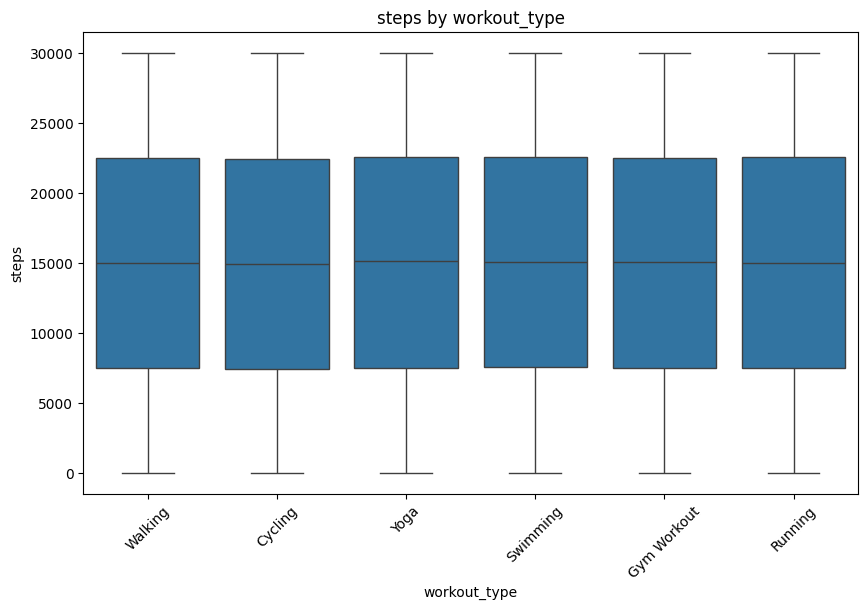

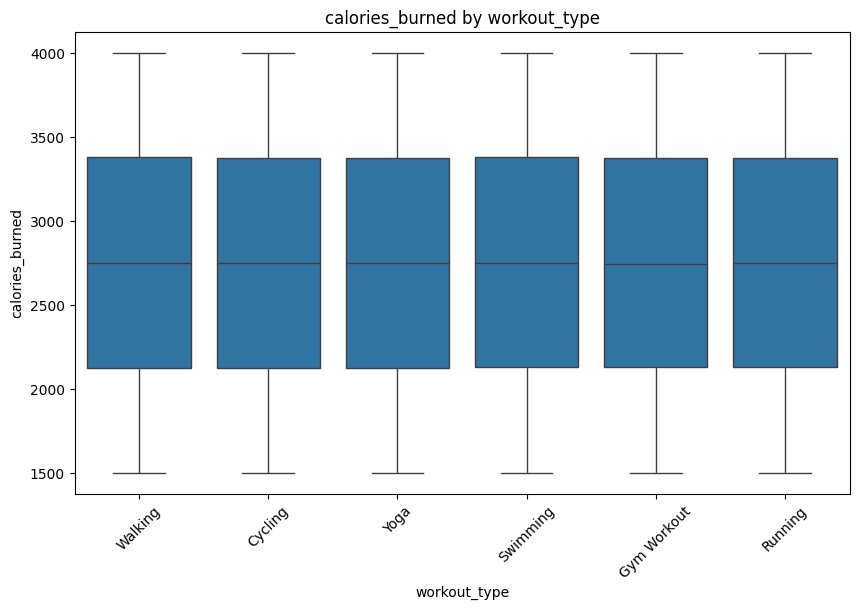

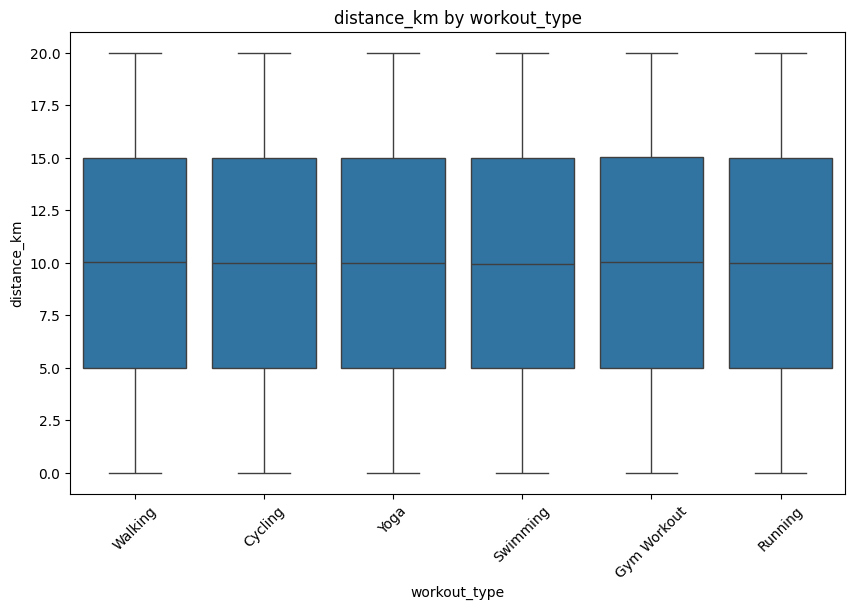

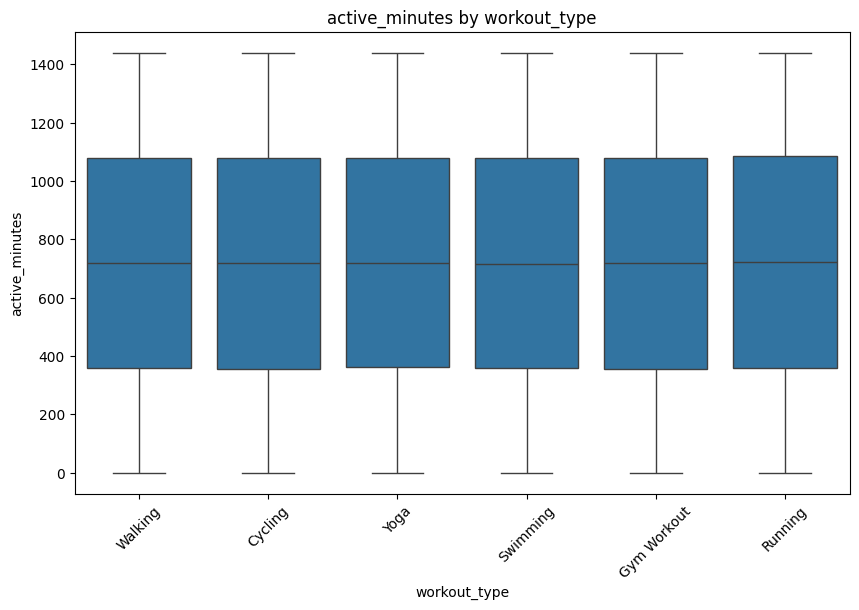

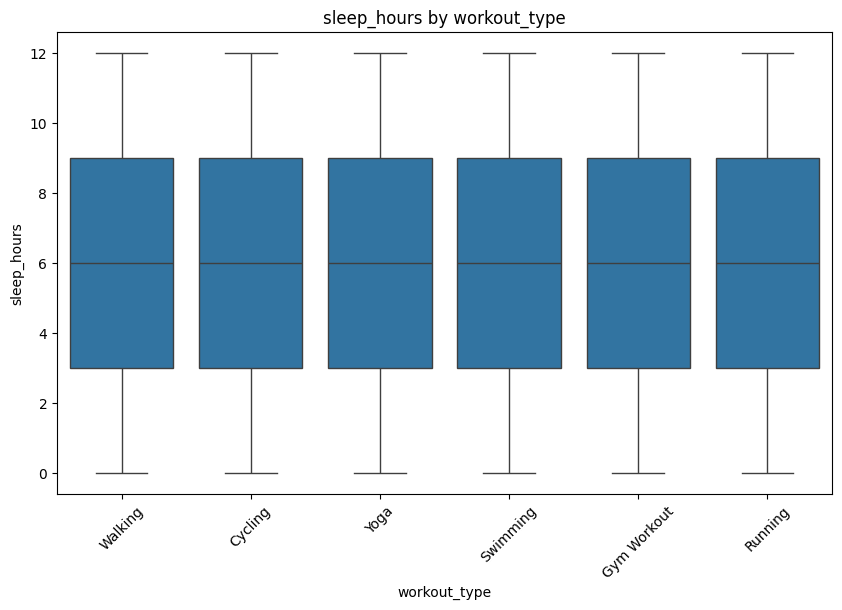

...

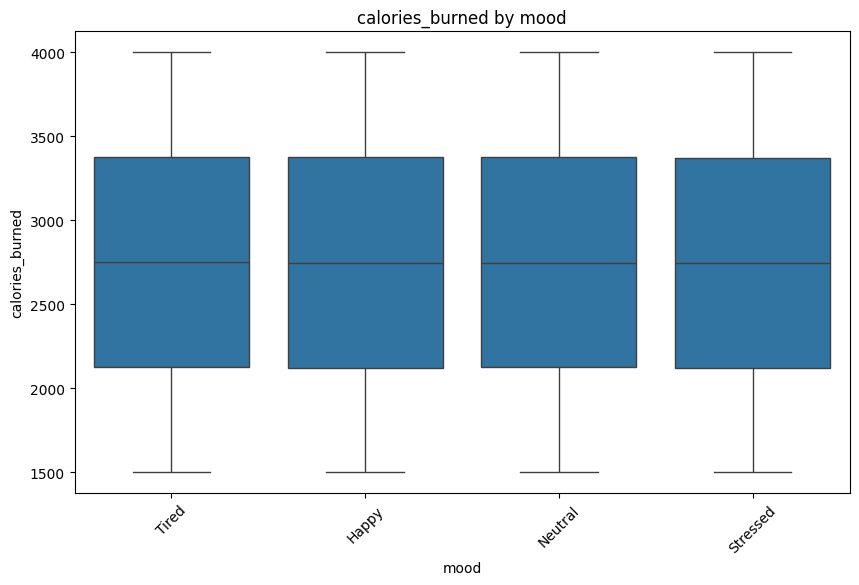

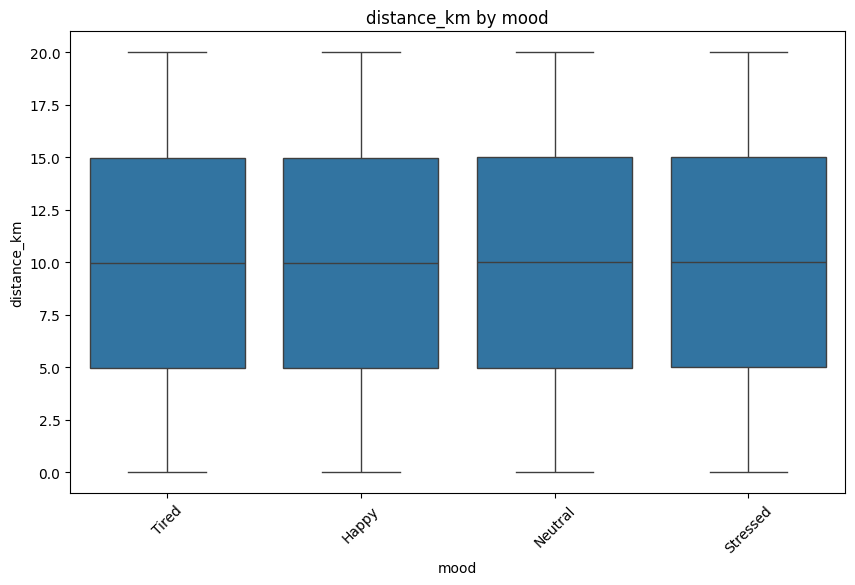

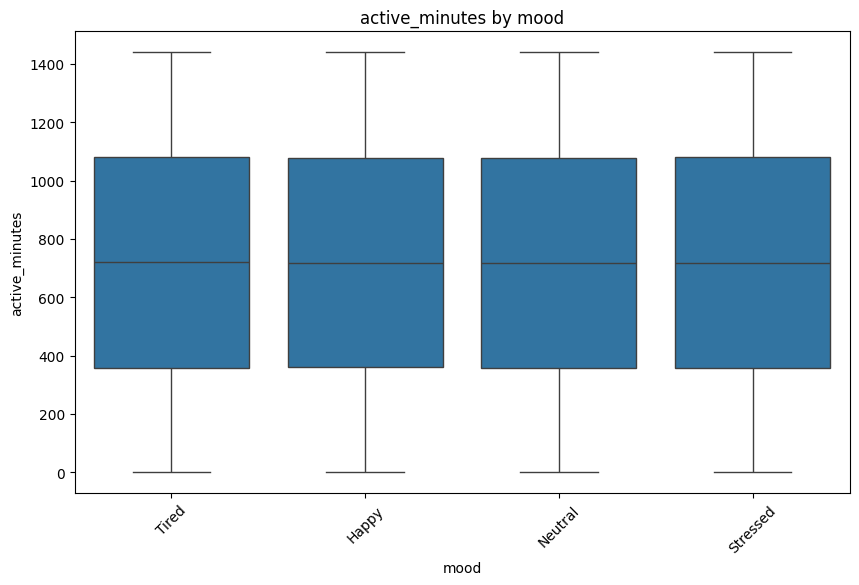

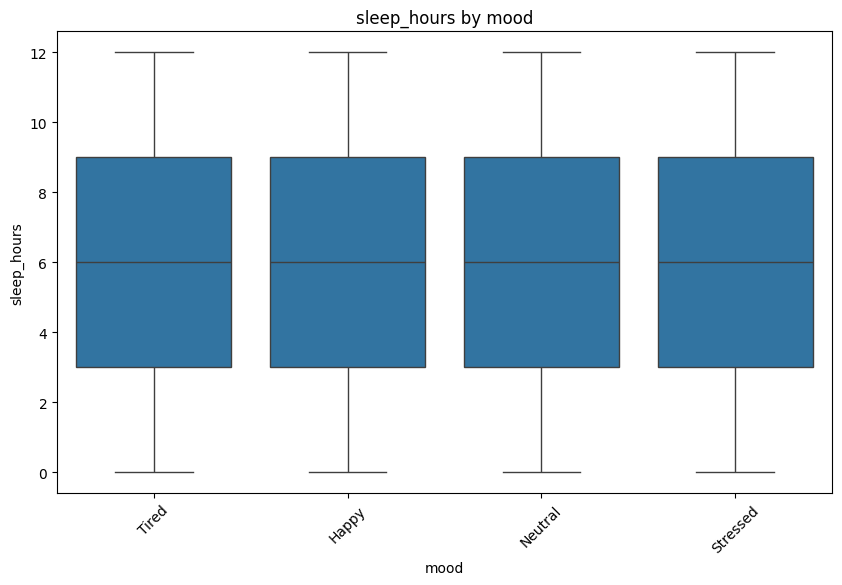

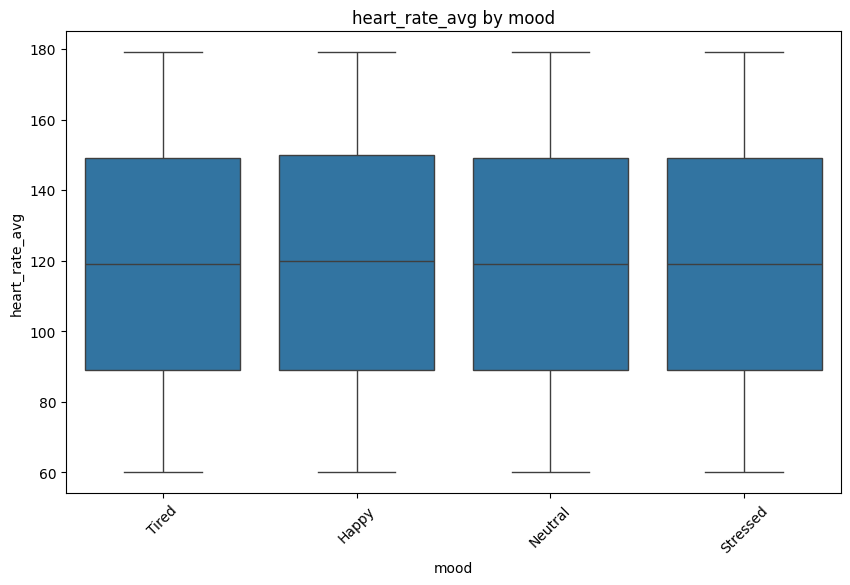

In [ ]:
# Define categorical columns
categorical_cols = ['workout_type', 'weather_conditions', 'location', 'mood']

# Plot boxplots for numerical variables against categorical variables
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=data[cat_col], y=data[num_col])
        plt.title(f'{num_col} by {cat_col}')
        plt.xticks(rotation=45)
        plt.show()


#Multivariate analysis

##Multivariate Relationships with Pairplot and Hue

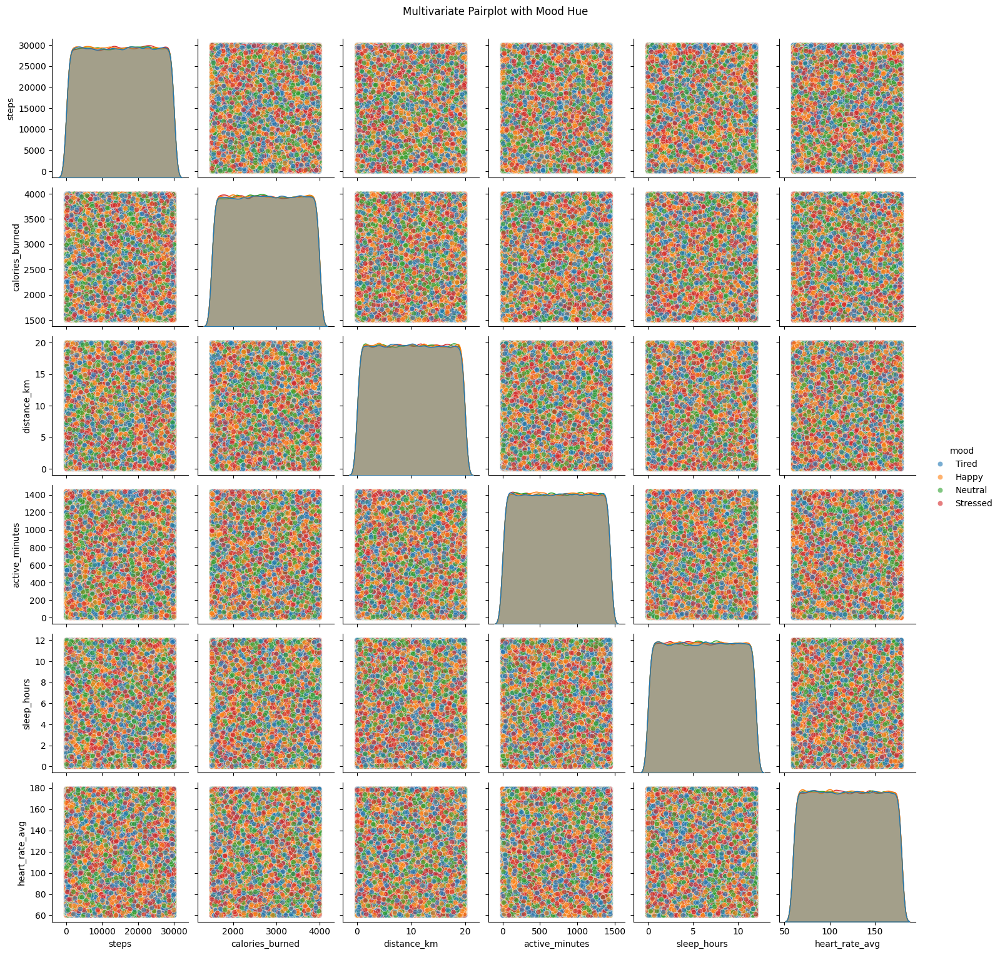

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Pairplot with a categorical variable (e.g., mood) as hue to see differences across groups
sns.pairplot(data, vars=['steps', 'calories_burned', 'distance_km', 'active_minutes', 'sleep_hours', 'heart_rate_avg'],
             hue='mood', plot_kws={'alpha':0.6})
plt.suptitle("Multivariate Pairplot with Mood Hue", y=1.02)
plt.show()


##Heatmap of Correlations for Selected Variables

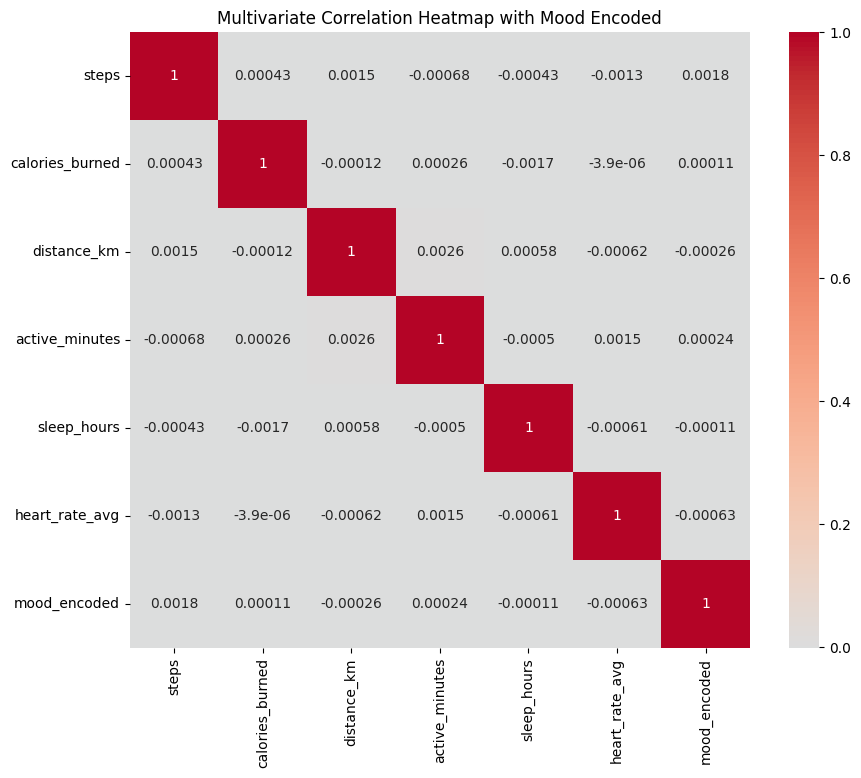

In [23]:
# Select a subset of columns for a focused correlation analysis
selected_cols = ['steps', 'calories_burned', 'distance_km', 'active_minutes', 'sleep_hours', 'heart_rate_avg', 'mood']

# Encode categorical variable 'mood' for correlation purposes
data['mood_encoded'] = data['mood'].astype('category').cat.codes

# Calculate and plot correlation, EXCLUDING the original 'mood' column
multivariate_corr = data[[c for c in selected_cols if c != 'mood'] + ['mood_encoded']].corr() # Exclude 'mood' and include 'mood_encoded'
plt.figure(figsize=(10, 8))
sns.heatmap(multivariate_corr, annot=True, cmap='coolwarm', center=0)
plt.title("Multivariate Correlation Heatmap with Mood Encoded")
plt.show()

##Multivariate Analysis using ANOVA

In [24]:
from scipy.stats import f_oneway

# Define numerical columns and categorical variable
numerical_cols = ['steps', 'calories_burned', 'distance_km', 'active_minutes', 'sleep_hours', 'heart_rate_avg']
categorical_var = 'mood'

# Run ANOVA for each numerical variable by 'mood' and print the results
print("ANOVA Results by Mood Category:\n")
for col in numerical_cols:
    groups = [data[col][data[categorical_var] == category] for category in data[categorical_var].unique()]
    f_val, p_val = f_oneway(*groups)
    print(f"{col} - F-value: {f_val:.2f}, p-value: {p_val:.4f}")


ANOVA Results by Mood Category:

steps - F-value: 2.72, p-value: 0.0427
calories_burned - F-value: 0.93, p-value: 0.4236
distance_km - F-value: 1.76, p-value: 0.1520
active_minutes - F-value: 0.21, p-value: 0.8863
sleep_hours - F-value: 0.19, p-value: 0.9012
heart_rate_avg - F-value: 0.22, p-value: 0.8817


##Multivariate Linear Regression

In [25]:
import statsmodels.api as sm

# Convert categorical mood to numeric encoding for regression analysis
data['mood_encoded'] = data['mood'].astype('category').cat.codes

# Define the predictor variables (numerical features)
X = data[['steps', 'calories_burned', 'distance_km', 'active_minutes', 'sleep_hours', 'heart_rate_avg']]
X = sm.add_constant(X)  # Adds a constant term to the model

# Define the target variable
y = data['mood_encoded']

# Fit the regression model
model = sm.OLS(y, X).fit()
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:           mood_encoded   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.5491
Date:                Thu, 31 Oct 2024   Prob (F-statistic):              0.771
Time:                        13:11:36   Log-Likelihood:            -1.3113e+06
No. Observations:              856880   AIC:                         2.623e+06
Df Residuals:                  856873   BIC:                         2.623e+06
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               1.4970      0.008    1

##Multivariate Visualization with Heatmap Clustering

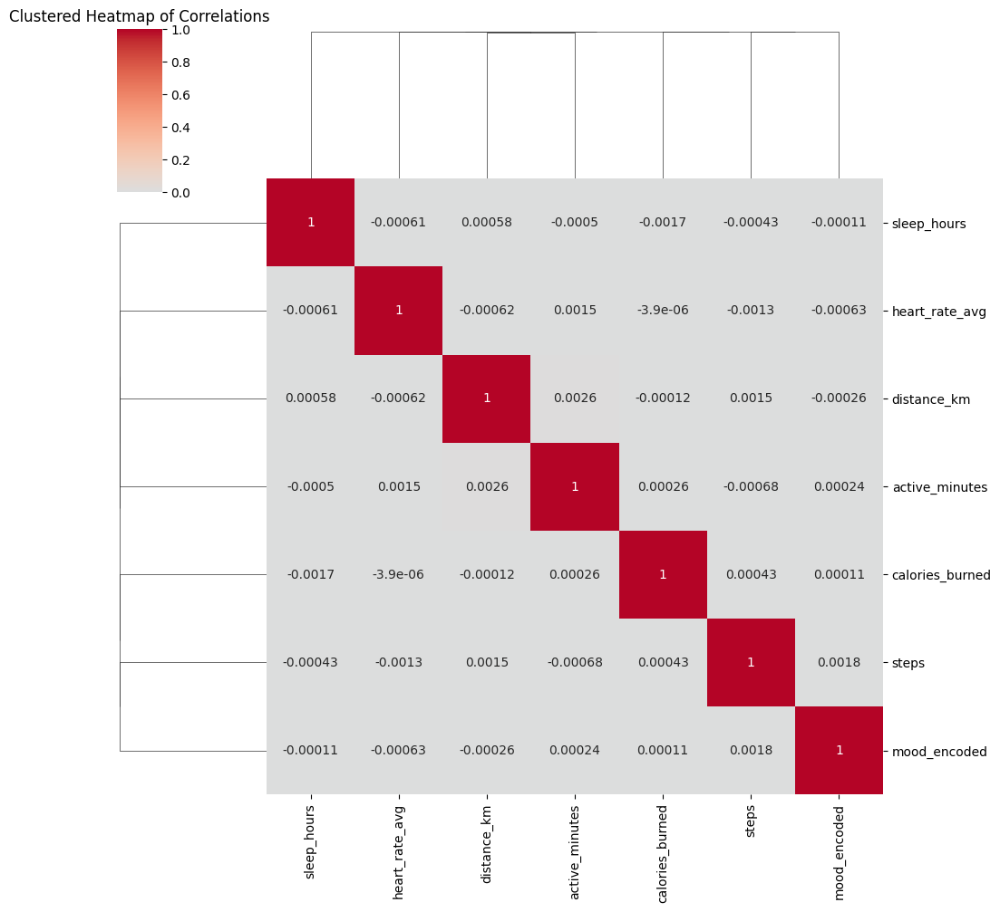

In [26]:
# Clustermap for correlation-based clustering
sns.clustermap(multivariate_corr, annot=True, cmap='coolwarm', center=0)
plt.title("Clustered Heatmap of Correlations")
plt.show()


##Exploratory Analysis


##Normalizing and Scaling the Data

In [27]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Define numerical columns to normalize and scale
numerical_cols = ['steps', 'calories_burned', 'distance_km', 'active_minutes', 'sleep_hours', 'heart_rate_avg']

# Scaling data to zero mean and unit variance (Standardization)
scaler = StandardScaler()
data_standardized = data.copy()
data_standardized[numerical_cols] = scaler.fit_transform(data[numerical_cols])

# Normalizing data to a 0-1 range (Min-Max Scaling)
normalizer = MinMaxScaler()
data_normalized = data.copy()
data_normalized[numerical_cols] = normalizer.fit_transform(data[numerical_cols])

# Display standardized and normalized data samples
print("Standardized Data Sample:\n", data_standardized.head())
print("\nNormalized Data Sample:\n", data_normalized.head())


Standardized Data Sample:
    user_id       date     steps  calories_burned  distance_km  active_minutes  \
0      468 2023-01-01 -1.210144        -0.287756     1.057601       -0.255921   
1      879 2023-01-01 -0.392152        -1.427226    -0.327824       -0.883540   
2      152 2023-01-01  1.423528        -1.447195    -1.112321       -1.162482   
3      311 2023-01-01 -0.178964         0.224095    -0.620495        1.465824   
4      759 2023-01-01  0.042655         0.822931     1.365858       -1.604942   

   sleep_hours  heart_rate_avg workout_type weather_conditions location  \
0    -1.298774        1.632052      Walking              Clear     Park   
1     0.086654        0.246590      Cycling                Fog     Park   
2     0.202106        0.419772         Yoga               Snow     Park   
3     1.616397       -0.099776     Swimming               Rain   Office   
4     0.404148       -1.023418     Swimming               Rain   Office   

      mood  year  month  day  mood_

##Sub-setting the Data

In [28]:
# Example: Subset data where 'mood' is 'Happy' and 'workout_type' is 'Running'
subset_data = data[(data['mood'] == 'Happy') & (data['workout_type'] == 'Running')]

# Display the subset sample
print("Subset Data Sample:\n", subset_data.head())


Subset Data Sample:
      user_id       date  steps  calories_burned  distance_km  active_minutes  \
28       882 2023-01-01   9556          3581.64         7.98             463   
86       126 2023-01-01   1768          1722.24        14.29             296   
120      109 2023-01-01  17231          2151.77        11.67             917   
157      798 2023-01-01  29755          2365.36        12.95            1027   
183      564 2023-01-01  24737          3636.88         2.63             212   

     sleep_hours  heart_rate_avg workout_type weather_conditions location  \
28           7.9              97      Running              Clear     Park   
86           2.2              70      Running               Snow     Park   
120          8.3             169      Running                Fog     Park   
157          9.1             109      Running              Clear      Gym   
183          2.1             106      Running               Rain     Park   

      mood  year  month  day  mood_

##Association Rules using the Apriori Algorithm

In [33]:
from mlxtend.frequent_patterns import apriori, association_rules

# Convert categorical data to one-hot encoding for association rules
data_encoded = pd.get_dummies(data[['workout_type', 'weather_conditions', 'location', 'mood']])

# Apply the Apriori algorithm
frequent_itemsets = apriori(data_encoded, min_support=0.01, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1)

# Display association rules
print("Association Rules:\n", rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']].head())


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Association Rules:
                  antecedents                consequents   support  confidence  \
0   (weather_conditions_Fog)     (workout_type_Cycling)  0.041913    0.167239   
1     (workout_type_Cycling)   (weather_conditions_Fog)  0.041913    0.250945   
2  (weather_conditions_Snow)     (workout_type_Cycling)  0.041756    0.167093   
3     (workout_type_Cycling)  (weather_conditions_Snow)  0.041756    0.250009   
4            (location_Home)     (workout_type_Cycling)  0.033603    0.167675   

       lift  
0  1.001322  
1  1.001322  
2  1.000446  
3  1.000446  
4  1.003930  


##K-Means Clustering


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


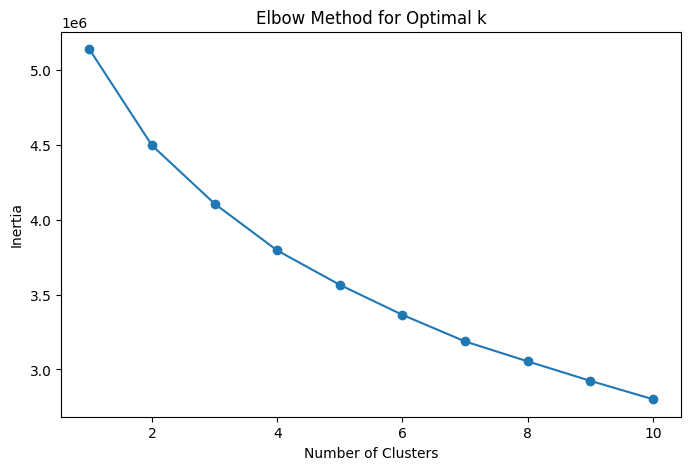

Clustered Data Sample:
       steps  calories_burned  distance_km  active_minutes  sleep_hours  \
0 -1.210144        -0.287756     1.057601       -0.255921    -1.298774   
1 -0.392152        -1.427226    -0.327824       -0.883540     0.086654   
2  1.423528        -1.447195    -1.112321       -1.162482     0.202106   
3 -0.178964         0.224095    -0.620495        1.465824     1.616397   
4  0.042655         0.822931     1.365858       -1.604942     0.404148   

   heart_rate_avg  cluster  
0        1.632052        2  
1        0.246590        2  
2        0.419772        1  
3       -0.099776        0  
4       -1.023418        0  


In [34]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Using standardized data for clustering
X = data_standardized[numerical_cols]

# Determine optimal number of clusters using the elbow method
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

# Perform K-Means clustering with optimal k (e.g., 3)
kmeans = KMeans(n_clusters=3, random_state=0)
data_standardized['cluster'] = kmeans.fit_predict(X)

# Display clustering results
print("Clustered Data Sample:\n", data_standardized[['steps', 'calories_burned', 'distance_km', 'active_minutes',
                                                    'sleep_hours', 'heart_rate_avg', 'cluster']].head())
